
<br>
<font>
<div dir=ltr align=center>
<img src="https://cdn.freebiesupply.com/logos/large/2x/sharif-logo-png-transparent.png" width=150 height=150>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Artificial Intelligence <br>
<font color=2565AE size=5>
    Computer Engineering Department <br>
    Spring 2025<br>
<font color=3C99D size=5>
    Project-Phase1<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Baghayi Nejad-Armin Khosravi


<font size=5 color=cyan> Names:
Matin Bagheri, Ali Hossein Khalaj, Parsa NorouziManesh

Student Numbers: 402105727, 402172069, 402106723  </font>

# Introduction

In this Project, we will become familiar with UNet architecture, Attention mechanism, and Residual blocks with the help of which we will build UNet, AttentionUNet, and ResidualAttentionUnet from scratch using PyTorch framework. The built models will be evaluated by various metrics such as accuracy, Iou score, and Dice score.

### Environment Setup

Here you will find the required packages. Feel free to add the list.

In [58]:
import os
import shutil
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import kagglehub
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch.optim import Adam
from tqdm import tqdm
import random
import torchvision.transforms.functional as TF

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device
# MAKE SURE THE RESULT IS "cuda"
# if it's not: in colab, "runtime" —> "change runtime type" —> change runtime type to a gpu

'cuda'

### Hyperparameter Setting

Place your hyperparameters' values in the cell below.

In [59]:
# Hyperparameters
IMAGE_SIZE = (256, 256)
BATCH_SIZE = 16
NUM_WORKERS = 2
LR = 3e-3  # Learning rate
NUM_EPOCHS = 15  # Number of training epochs

# Data Preparation

Our task is to segment the [Massachusetts Road Dataset](https://www.kaggle.com/datasets/balraj98/massachusetts-roads-dataset). You can download this dataset by placing your API Token from kaggle in ```~/.kaggle/``` folder (Instructions can be found in the Kaggle website) and then running the code below.

In [3]:
# Download dataset
path = kagglehub.dataset_download("balraj98/massachusetts-roads-dataset")
print("Path to dataset files:", path)
DATA_DIR = path

# Verify files
print("Sample files:", os.listdir(DATA_DIR)[:5])

Path to dataset files: /kaggle/input/massachusetts-roads-dataset
Sample files: ['label_class_dict.csv', 'tiff', 'metadata.csv']


If you are running on colab, it is highly recommended to save the dataset to your drive to avoid problems when disconnecting from runtime.

In [ ]:
          # !!! DO NOT RUN THIS !!!
#  AS IT WILL TRY TO SAVE THE DATABASE IN YOUR GOOGLE DRIVE
# AND NEEDS MORE THAN 15 GB OF AVAILABLE SPACE

from google.colab import drive

drive.mount('/content/drive', force_remount=True)

shutil.move(path, '/content/drive/MyDrive/')

### Loading Images

Load the images and their corresponding masks in two separate lists. (The cell below might take some time to execute.)

In [24]:
# remove invalid images
def load_images_and_masks(images_path, masks_path, image_size, white_threshold=0.2):

    image_files = sorted(os.listdir(images_path))
    mask_files = sorted(os.listdir(masks_path))

    if len(image_files) != len(mask_files):
        raise ValueError("Number of images and masks do not match!")

    images = []
    masks = []

    for img_file, mask_file in zip(image_files, mask_files):
        img = Image.open(os.path.join(images_path, img_file)).resize(image_size)

        # Use average downsampling
        mask = Image.open(os.path.join(masks_path, mask_file)).resize(image_size, resample=Image.BOX)
        mask_np = np.array(mask, dtype=np.float32) / 255.0  # keep average values in [0,1]

        img_np = np.array(img)

        # Count pure white pixels in image
        if img_np.ndim == 3:  # RGB
            white_pixels = np.all(img_np == [255, 255, 255], axis=-1)
        else:  # Grayscale
            white_pixels = img_np == 255

        white_ratio = np.sum(white_pixels) / white_pixels.size

        # Keep only if white ratio <= threshold
        if white_ratio <= white_threshold:
            images.append(img_np)
            masks.append(mask_np)

    return np.array(images), np.array(masks)

In [9]:
# Define image and mask directories
train_images_dir = os.path.join(DATA_DIR, 'tiff/train')
train_masks_dir = os.path.join(DATA_DIR, 'tiff/train_labels')
val_images_dir = os.path.join(DATA_DIR, "tiff/val")
val_masks_dir = os.path.join(DATA_DIR, "tiff/val_labels")
test_images_dir = os.path.join(DATA_DIR, "tiff/test")
test_masks_dir = os.path.join(DATA_DIR, "tiff/test_labels")

train_images, train_masks = load_images_and_masks(train_images_dir, train_masks_dir, IMAGE_SIZE)
val_images, val_masks = load_images_and_masks(val_images_dir, val_masks_dir, IMAGE_SIZE)
test_images, test_masks = load_images_and_masks(test_images_dir, test_masks_dir, IMAGE_SIZE)

In [10]:
print("train: ", len(train_images), "==", len(train_masks))   # was initially 1108, 267 of them were more than 20% white
print("validation: ", len(val_images), "==", len(val_masks))
print("test: ", len(test_images), "==", len(test_masks))

train:  841 == 841
validation:  14 == 14
test:  49 == 49


### Data Visualization

Display the images and their masks for several samples.

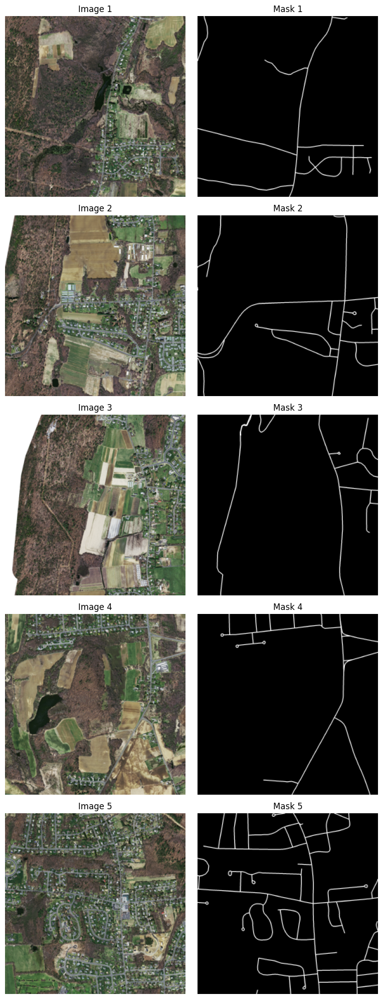

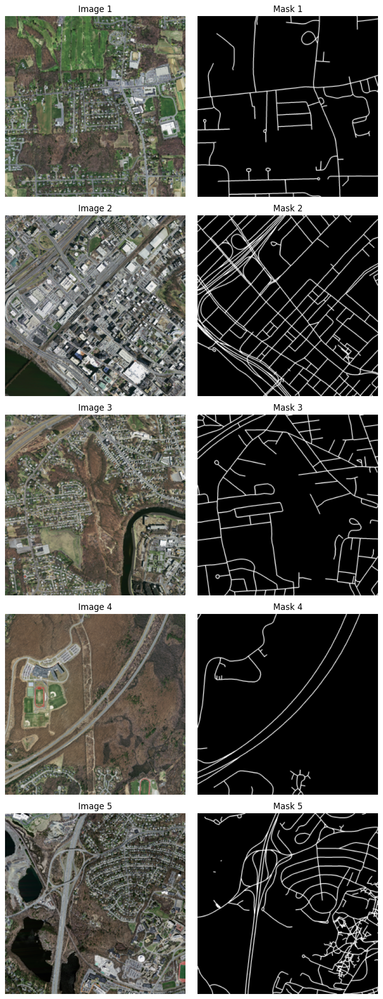

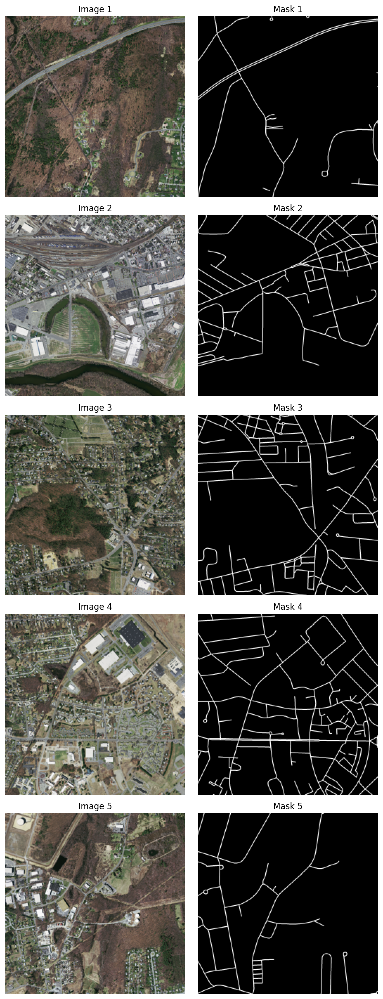

In [11]:
def visualize_images_and_masks(images, masks, n=5):
    plt.figure(figsize=(8, 4 * n))
    for i in range(n):
        plt.subplot(n, 2, 2 * i + 1)
        plt.imshow(images[i])
        plt.title(f"Image {i+1}")
        plt.axis('off')
        plt.subplot(n, 2, 2 * i + 2)
        plt.imshow(masks[i], cmap='gray')
        plt.title(f"Mask {i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_images_and_masks(train_images, train_masks)
visualize_images_and_masks(val_images, val_masks)
visualize_images_and_masks(test_images, test_masks)

### Dataset Creation

Finally, we will make the dataset using the list of images we have stored.

In [21]:
image_transform = transforms.Compose([
    transforms.ToTensor(),
])
mask_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x > 0.1).float())  # threshold at 0.1
])

class RoadDataset(Dataset):
    def __init__(self, images, masks, image_transform=None, mask_transform=None):
        self.images = images
        self.masks = masks
        self.image_transform = image_transform
        self.mask_transform = mask_transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        # Convert to PIL
        image = Image.fromarray(image)
        mask = Image.fromarray(mask)

        # Flips
        if random.random() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)
        if random.random() > 0.5:
            image = TF.vflip(image)
            mask = TF.vflip(mask)

        if self.image_transform:
            image = self.image_transform(image)
        if self.mask_transform:
            mask = self.mask_transform(mask)

        return image, mask

# Create datasets
train_dataset = RoadDataset(train_images, train_masks, image_transform=image_transform, mask_transform=mask_transform)
val_dataset = RoadDataset(val_images, val_masks, image_transform=image_transform, mask_transform=mask_transform)
test_dataset = RoadDataset(test_images, test_masks, image_transform=image_transform, mask_transform=mask_transform)
# Create loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)   # shuffle through train dataset
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

# UNet

Before proceeding, it is necessary to understand the idea behind UNet. In order to avoid too much details in this notebook, you can read the complete paper for UNet from [this link](https://arxiv.org/pdf/1505.04597).

The overall structure of UNet is provided in the image below.

![UNet Architecture](https://viso.ai/wp-content/uploads/2024/04/unet-process.png)

### Convolution Block

Convolution block is used at each level of UNet.

In [60]:
class ConvBlock(nn.Module):
    """
    A convolutional block consisting of multiple layers (e.g., Conv2D, BatchNorm, ReLU).

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
    """
    def __init__(self, in_channel, out_channel):
        super().__init__()
        self.conv = nn.Sequential(
            # first conv
            nn.Conv2d(in_channel, out_channel, kernel_size=3, padding=1), # preserve image size
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True),
            # second conv
            nn.Conv2d(out_channel, out_channel, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

### Up Convoluitional Block

We use another block to upsample the latent vector.

In [15]:
class UpConvBlock(nn.Module):
    """
    An upsampling block used in decoder parts of segmentation networks like U-Net.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
    """
    def __init__(self, in_channel, out_channel):
        super().__init__()
        self.upconv = nn.Sequential(
            nn.ConvTranspose2d(in_channel, out_channel, kernel_size=2, stride=2),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.upconv(x)

### Complete UNet Structure

Now using the ```ConvBlock``` and ```UpConvBlock``` you created, complete the UNet architecture.

In [16]:
class UNet(nn.Module):
    """
    U-Net architecture for image segmentation tasks.

    Args:
        in_channel (int): Number of input channels (e.g., 3 for RGB images).
        out_channel (int): Number of output channels (e.g., 1 for binary segmentation).
        filter (list): List of filter sizes for each level of the encoder/decoder.
    """
    def __init__(self, in_channel=3, out_channel=1, filter=[64, 128, 256, 512]):
        super().__init__()
        # Encoder blocks
        self.enc_blocks = nn.ModuleList([ConvBlock(in_channel if i == 0 else filter[i-1], f)  # goes right
                                         for i, f in enumerate(filter)])  #i: index, f: value
        self.pool = nn.MaxPool2d(2) # goes down

        # Decoder blocks
        self.decoder = nn.ModuleList()
        for i in range(len(filter)-1, 0, -1):
            self.decoder.append(UpConvBlock(filter[i], filter[i-1]))  # goes up
            self.decoder.append(ConvBlock(filter[i-1] * 2, filter[i-1]))  # goes right

        # Final convolution, outputs mask image
        self.final_conv = nn.Conv2d(filter[0], out_channel, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x): # initial x is the input image
        # Encoder path
        enc_features = []       # the values we pass horizontally across unet (Skip connection)
        for block in self.enc_blocks[:-1]:  # all enc_blocks except for the last one (the one at the bottom, called Bottleneck)
            x = block(x)
            enc_features.append(x)
            x = self.pool(x)    # goes down
        x = self.enc_blocks[-1](x)  # Bottleneck

        # Decoder path
        for i in range(0, len(self.decoder), 2):
            x = self.decoder[i](x)  # Upsampling (up)
            enc_feat = enc_features[-(i // 2 + 1)]  # Corresponding encoder feature
            x = torch.cat([x, enc_feat], dim=1)  # Skip connection
            x = self.decoder[i + 1](x)  # Convolution (right)

        # Final output
        x = self.final_conv(x)
        x = self.sigmoid(x)
        return x  # the final mask

# Attention UNet

### Attention Mechanism

Attention UNet uses this mechanism to know what part the image is more important to attend to. You can read about this mechanism from [this link](https://arxiv.org/pdf/1706.03762). The Attention mechanism in UNet is described in [this paper](https://arxiv.org/pdf/1804.03999).


![Attention](https://www.researchgate.net/publication/373655981/figure/fig3/AS:11431281186315360@1693879045519/Visualization-of-attention-blocks-reveals-their-functionality-While-the-self-attention.png)

In [25]:
class AttentionBlock(nn.Module):
    """
    Attention block for focusing on relevant features in skip connections.

    Args:
        f_g (int): Number of channels in the gating signal (from decoder).
        f_l (int): Number of channels in the skip connection input (from encoder).
        f_int (int): Number of intermediate channels used within the attention block.
    """
    def __init__(self, f_g, f_l, f_int):
        super().__init__()
         # Transform the gating signal
        self.w_g = nn.Sequential(
            nn.Conv2d(f_g, f_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(f_int)
        )
        # Transform the encoder input (skip connection)
        self.w_x = nn.Sequential(
            nn.Conv2d(f_l, f_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(f_int)
        )
        # Combine and produce attention map
        self.psi = nn.Sequential(
            nn.Conv2d(f_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        # Activation for combined features
        self.act = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.w_g(g)  # Gating signal processing
        x1 = self.w_x(x)  # Skip connection processing
        psi = self.psi(self.act(g1 + x1))  # Attention coefficients, Combine and activate
        return x * psi    # Apply attention to skip connection

Now use the ```AttentionBlock``` to inherit [Attention UNet](https://arxiv.org/pdf/1804.03999) from UNet.

![Attention UNet](https://www.researchgate.net/publication/347344899/figure/fig6/AS:971357475069952@1608601077414/The-architecture-of-Attention-U-Net-Attention-gate-selects-features-by-using-the.png)

In [26]:
class AttentionUNet(UNet):  # Inherits from UNet
    """
    Attention U-Net architecture which extends the basic U-Net
    by integrating attention blocks in the skip connections.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
        filter_sizes (list): List of filter sizes for each level.
    """
    def __init__(self, in_channel=3, out_channel=1, filter_sizes=[64, 128, 256, 512]):
        super().__init__(in_channel, out_channel, filter_sizes)

        # One attention block per skip connection (deep -> shallow order)
        attn_blocks = []
        for i in range(len(filter_sizes) - 1, 0, -1):
            f = filter_sizes[i - 1]           # channels of both the skip and the upsampled decoder feature
            f_int = max(1, f // 2)
            attn_blocks.append(AttentionBlock(f_g=f, f_l=f, f_int=f_int))
        self.attn_blocks = nn.ModuleList(attn_blocks)

    def forward(self, x):
        # Encoder path (same as UNet)
        enc_features = []
        for block in self.enc_blocks[:-1]:
            x = block(x)
            enc_features.append(x)
            x = self.pool(x)
        x = self.enc_blocks[-1](x)  # bottleneck

        # Decoder path with attention on skip connections
        for i in range(0, len(self.decoder), 2):
            up = self.decoder[i](x)  # upsampled decoder feature (gating signal)
            enc_feat = enc_features[-(i // 2 + 1)]  # corresponding encoder feature
            attn_feat = self.attn_blocks[i // 2](up, enc_feat)  # apply attention
            x = torch.cat([up, attn_feat], dim=1)   # concatenate attended skip
            x = self.decoder[i + 1](x)              # conv block

        x = self.final_conv(x)
        x = self.sigmoid(x)
        return x

# Residual Attention UNet

We will add residual blocks to the attention for better gradient flow. You can read more about residual blocks [here](https://arxiv.org/pdf/1512.03385).

<img src="https://dfzljdn9uc3pi.cloudfront.net/2023/cs-1302/1/fig-1-full.png" width="400" alt="ResUNet Architecture">

In [29]:
class ResidualConvBlock(nn.Module):
    """
    Residual convolutional block with skip connection.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
    """
    def __init__(self, in_channel, out_channel):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channel, out_channel, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channel)
        )
        self.shortcut = (
            nn.Sequential(
                nn.Conv2d(in_channel, out_channel, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_channel)
            ) if in_channel != out_channel else nn.Identity()
        )
        self.relu = nn.ReLU(inplace=True)

        # Optional: weight initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        residual = self.shortcut(x)
        out = self.conv1(x)
        out = self.conv2(out)
        out += residual  # Add the residual connection
        out = self.relu(out)
        return out


Use ```ResidualConvBlock``` to construct Residual Attention Unet.

In [27]:
class ResidualAttentionUNet(AttentionUNet):
    """
    Residual Attention U-Net combining residual blocks with attention mechanisms.

    Args:
        in_channel (int): Number of input channels.
        out_channel (int): Number of output channels.
        filter_sizes (list): List of filter sizes for each level.
    """
    def __init__(self, in_channel=3, out_channel=1, filter_sizes=[64, 128, 256, 512]):
        super().__init__(in_channel, out_channel, filter_sizes)

        # Replace standard ConvBlocks with ResidualConvBlocks in encoder
        self.enc_blocks = nn.ModuleList([
            ResidualConvBlock(in_channel if i == 0 else filter_sizes[i-1], f)
            for i, f in enumerate(filter_sizes)
        ])

        # Replace standard ConvBlocks with ResidualConvBlocks in decoder
        for i in range(0, len(self.decoder), 2):
            if isinstance(self.decoder[i+1], ConvBlock):
                # Replace with residual version
                self.decoder[i+1] = ResidualConvBlock(
                    filter_sizes[len(filter_sizes)-2 - i//2] * 2,  # Input channels (concat)
                    filter_sizes[len(filter_sizes)-2 - i//2]       # Output channels
                )

    def forward(self, x):
        # Encoder path
        enc_features = []
        for block in self.enc_blocks[:-1]:
            x = block(x)
            enc_features.append(x)
            x = self.pool(x)
        x = self.enc_blocks[-1](x)  # Bottleneck

        # Decoder path with attention and residual connections
        for i in range(0, len(self.decoder), 2):
            x = self.decoder[i](x)  # Upsampling
            enc_feat = enc_features[-(i//2 + 1)]  # Corresponding encoder feature
            attn = self.attn_blocks[i//2]  # Attention block
            attended_enc_feat = attn(x, enc_feat)  # Apply attention
            x = torch.cat([x, attended_enc_feat], dim=1)  # Concatenate
            x = self.decoder[i+1](x)  # Residual convolution

        # Final output
        x = self.final_conv(x)
        x = self.sigmoid(x)
        return x

# Training

Now it is time to train the model on training data.

### Loss Function

We will be using the sum of [Dice Score](https://oecd.ai/en/catalogue/metrics/dice-score#:~:text=The%20Dice%20score%20is%20calculated,sizes%20of%20the%20two%20sets.), [Iou Score](https://www.v7labs.com/blog/intersection-over-union-guide), and Binary Cross Entropy as loss function. You can read about the mentioned scores in the provided links.

<font color=cyan><b> Note: Do Not Change The ```OverallLoss``` Function as it is used for measuring you model's performance.</b></font>

In [17]:
### DICE LOSS
class DiceLoss(nn.Module):
    """
    Dice Loss for measuring overlap between predicted and ground truth masks.
    Particularly useful for imbalanced classes in segmentation tasks.

    Args:
        smooth (float): Small constant to avoid division by zero.
    """
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, real):
        # Flatten predictions and targets into 1D vectors
        pred = pred.view(-1)
        real = real.view(-1)

        # Calculate intersection and union
        intersection = (pred * real).sum()  # element-wise multiplication, then sum
        dice_coeff = (2. * intersection + self.smooth) / (pred.sum() + real.sum() + self.smooth)

        return 1 - dice_coeff

### Iou Loss
class IouLoss(nn.Module):
    """
    Intersection over Union (IoU) Loss for segmentation evaluation.
    Measures the overlap between predicted and ground truth masks.

    Args:
        smooth (float): Small constant to avoid division by zero.
    """
    def __init__(self, smooth=1e-6):
        super(IouLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, real):
        # Flatten predictions and targets
        pred = pred.view(-1)
        real = real.view(-1)

        # Calculate intersection and union
        intersection = (pred * real).sum()
        total = (pred + real).sum()
        union = total - intersection  # union = ∣pred∣ + ∣real∣ − ∣pred ∩ real∣

        iou_coeff = (intersection + self.smooth) / (union + self.smooth)

        return 1 - iou_coeff

### Overall Loss (DO NOT CHANGE)
class OverallLoss(nn.Module):
    """
    Combined loss function that sums Dice loss, IoU loss, and Binary Cross-Entropy loss.

    Args:
        smooth (float): Small constant to avoid division by zero.
    """
    def __init__(self, smooth=1e-6):
        super(OverallLoss, self).__init__()
        self.dice_loss = DiceLoss(smooth)
        self.iou_loss = IouLoss(smooth)
        self.bce_loss = nn.BCELoss()

    def forward(self, pred, real):
        dice = self.dice_loss(pred, real)
        iou = self.iou_loss(pred, real)
        bce = self.bce_loss(pred, real)

        return dice, iou, bce, dice+iou+bce

### Training Epoch

Complete the function below to train the model for one epoch.

In [18]:
def train_one_epoch(model, optimizer, criterion, data_loader, scheduler=None, device='cuda'):
    """
    Trains the model for one epoch.

    Args:
        model (nn.Module): The neural network model to train.
        optimizer (torch.optim.Optimizer): Optimizer for updating model parameters.
        criterion (nn.Module): Loss function to compute the loss.
        data_loader (DataLoader): DataLoader providing training batches.
        scheduler (optional): Learning rate scheduler.
        device (str): Device to run the training on ('cuda' or 'cpu').

    Returns:
        float: Average loss over the epoch.
    """

    total_loss = 0.0
    model.train()
    for i, (img, mask) in enumerate(tqdm(data_loader)):
        # Move the image and mask to device
        img = img.to(device, non_blocking=True)
        mask = mask.to(device, non_blocking=True)
        # Set the gradients to zero
        optimizer.zero_grad(set_to_none=True)

        # Predict the mask using the model
        pred = model(img)
        # Compute the loss
        _, _, _, loss = criterion(pred, mask)
        # Compute gradients
        loss.backward()

        # update the parameters
        optimizer.step()
        # Schedule the learning rate
        if scheduler:
            scheduler.step()

        total_loss += loss.item()

    return total_loss/len(data_loader)

Design a function for evaluation after each training phase.

In [19]:
def evaluate_model(model, criterion, data_loader, device='cuda'):
    """
    Evaluates the model on validation or test data.

    Args:
        model (nn.Module): The neural network model to evaluate.
        criterion (nn.Module): Loss function to compute evaluation metrics.
        data_loader (DataLoader): DataLoader providing evaluation batches.
        device (str): Device to run evaluation on ('cuda' or 'cpu').

    Returns:
        tuple: Average loss, average IoU score, and average Dice score over the dataset.
    """
    total_loss = 0.0
    iou_score = 0.0
    dice_score = 0.0
    model.eval()

    with torch.no_grad():
        for i, (img, mask) in enumerate(tqdm(data_loader)):
            # Move the image and mask to device
            img = img.to(device)
            mask = mask.to(device)

            # Predict the mask
            pred = model(img)

            # Compute the loss
            dice_loss, iou_loss, bce_loss, overall_loss = criterion(pred, mask)

            total_loss += overall_loss.item()
            iou_score += 1 - iou_loss.item()
            dice_score += 1 - dice_loss.item()

        total_loss /= len(data_loader)
        iou_score /= len(data_loader)
        dice_score /= len(data_loader)

    return total_loss, iou_score, dice_score

# Model Training

### UNet  
Create an instance of UNet and train it. Then report the results.  

<b><font color=red>Note: your models need to satisfy below conditions to get complete score.</font></b>

<table style="width: 100%; font-size: 18px; border-collapse: collapse; margin: 15px 0;">
  <tr>
    <th style="text-align: left; padding: 8px; border-bottom: 2px solid #ddd;">Model</th>
    <th style="text-align: right; padding: 8px; border-bottom: 2px solid #ddd;">Validation Loss</th>
    <th style="text-align: right; padding: 8px; border-bottom: 2px solid #ddd;">Iou Score</th>
    <th style="text-align: right; padding: 8px; border-bottom: 2px solid #ddd;">Dice Score</th>
  </tr>
  <tr>
    <td style="padding: 8px; border-bottom: 1px solid #ddd;">UNet</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&lt; 1.0</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.5</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.6</td>
  </tr>
  <tr>
    <td style="padding: 8px; border-bottom: 1px solid #ddd;">Attention UNet</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&lt; 0.9</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.6</td>
    <td style="text-align: right; padding: 8px; border-bottom: 1px solid #ddd;">&gt; 0.65</td>
  </tr>
  <tr>
    <td style="padding: 8px;">Residual Attention UNet</td>
    <td style="text-align: right; padding: 8px;">&lt; 0.8</td>
    <td style="text-align: right; padding: 8px;">&gt; 0.65</td>
    <td style="text-align: right; padding: 8px;">&gt; 0.7</td>
  </tr>
</table>

In [61]:
unet = UNet().to(device)
criterion = OverallLoss()

# Enhanced Optimizer (AdamW often works better than Adam for segmentation)
optimizer = torch.optim.AdamW(
    unet.parameters(),
    lr=LR,                      # Lower initial LR for stability
    weight_decay=1e-5,          # Stronger regularization
    betas=(0.9, 0.999)          # Default betas (more stable than (0.9, 0.98))
)

# Cosine Annealing LR Scheduler with Warmup
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=LR,                  # Matches optimizer's initial LR
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(train_loader),
    pct_start=0.3,              # 30% of epochs for warmup
    anneal_strategy='cos',
    div_factor=100,             # max_lr/div_factor = 1e-3/100 = 1e-5 (start)
    final_div_factor=0.1        # Will end around 1e-4
)

# For plotting
train_losses1, val_losses1, lr_history1 = [], [], []

best = {"val_loss1": float("inf"), "iou1": 0.0, "dice1": 0.0, "epoch1": -1}

for i in range(NUM_EPOCHS):
    train_loss = train_one_epoch(unet, optimizer, criterion, train_loader, scheduler, device)
    val_loss, iou_score, dice_score = evaluate_model(unet, criterion, test_loader, device)

    # Track for plots
    train_losses1.append(train_loss)
    val_losses1.append(val_loss)
    lr_history1.append(optimizer.param_groups[0]["lr"])

    # Save best
    if val_loss < best["val_loss1"]:
        best.update({"val_loss1": val_loss, "iou1": iou_score, "dice1": dice_score, "epoch1": i+1})
        torch.save(unet.state_dict(), "best_unet.pth")

    print(f"Iteration {i+1}/{NUM_EPOCHS}: "
          f"Train Loss: {train_loss:.2f} | "
          f"Val Loss: {val_loss:.2f} | "
          f"Iou Score: {iou_score:.2f} | "
          f"Dice: {dice_score:.2f} | "
          f"LR: {optimizer.param_groups[0]['lr']:.2e}")


print(
    f"Best @ epoch {best['epoch1']}: "
    f"Val Loss: {best['val_loss1']:.2f} | IoU: {best['iou1']:.2f} | Dice: {best['dice1']:.2f}"
    )

100%|██████████| 4/4 [00:00<00:00,  4.34it/s]


Iteration 1/15: Train Loss: 2.23 | Val Loss: 1.99 | Iou Score: 0.14 | Dice: 0.24 | LR: 3.80e-04


100%|██████████| 4/4 [00:01<00:00,  3.82it/s]


Iteration 2/15: Train Loss: 1.76 | Val Loss: 1.60 | Iou Score: 0.22 | Dice: 0.36 | LR: 1.27e-03


100%|██████████| 4/4 [00:00<00:00,  4.45it/s]


Iteration 3/15: Train Loss: 1.23 | Val Loss: 1.22 | Iou Score: 0.39 | Dice: 0.56 | LR: 2.27e-03


100%|██████████| 4/4 [00:00<00:00,  4.41it/s]


Iteration 4/15: Train Loss: 1.01 | Val Loss: 1.40 | Iou Score: 0.33 | Dice: 0.50 | LR: 2.92e-03


100%|██████████| 4/4 [00:00<00:00,  4.52it/s]


Iteration 5/15: Train Loss: 0.93 | Val Loss: 0.97 | Iou Score: 0.50 | Dice: 0.66 | LR: 2.98e-03


100%|██████████| 4/4 [00:00<00:00,  4.45it/s]


Iteration 6/15: Train Loss: 0.88 | Val Loss: 0.76 | Iou Score: 0.60 | Dice: 0.75 | LR: 2.86e-03


100%|██████████| 4/4 [00:00<00:00,  4.45it/s]


Iteration 7/15: Train Loss: 0.86 | Val Loss: 0.86 | Iou Score: 0.55 | Dice: 0.71 | LR: 2.63e-03


100%|██████████| 4/4 [00:00<00:00,  4.47it/s]


Iteration 8/15: Train Loss: 0.83 | Val Loss: 0.69 | Iou Score: 0.63 | Dice: 0.78 | LR: 2.32e-03


100%|██████████| 4/4 [00:00<00:00,  4.54it/s]


Iteration 9/15: Train Loss: 0.82 | Val Loss: 0.67 | Iou Score: 0.65 | Dice: 0.78 | LR: 1.94e-03


100%|██████████| 4/4 [00:00<00:00,  4.46it/s]


Iteration 10/15: Train Loss: 0.81 | Val Loss: 0.68 | Iou Score: 0.64 | Dice: 0.78 | LR: 1.54e-03


100%|██████████| 4/4 [00:00<00:00,  4.10it/s]


Iteration 11/15: Train Loss: 0.79 | Val Loss: 0.63 | Iou Score: 0.66 | Dice: 0.80 | LR: 1.15e-03


100%|██████████| 4/4 [00:00<00:00,  4.31it/s]


Iteration 12/15: Train Loss: 0.76 | Val Loss: 0.64 | Iou Score: 0.66 | Dice: 0.80 | LR: 8.02e-04


100%|██████████| 4/4 [00:00<00:00,  4.19it/s]


Iteration 13/15: Train Loss: 0.75 | Val Loss: 0.60 | Iou Score: 0.68 | Dice: 0.81 | LR: 5.30e-04


100%|██████████| 4/4 [00:00<00:00,  4.22it/s]


Iteration 14/15: Train Loss: 0.74 | Val Loss: 0.60 | Iou Score: 0.68 | Dice: 0.81 | LR: 3.58e-04


100%|██████████| 4/4 [00:00<00:00,  4.30it/s]

Iteration 15/15: Train Loss: 0.74 | Val Loss: 0.59 | Iou Score: 0.69 | Dice: 0.81 | LR: 3.00e-04
Best @ epoch 15: Val Loss: 0.59 | IoU: 0.69 | Dice: 0.81


Now do the same for Attention UNet and Reidual Attention UNet.

In [67]:
attention_unet = AttentionUNet().to(device)
criterion = OverallLoss()

# Enhanced Optimizer (AdamW often works better than Adam for segmentation)
optimizer = torch.optim.AdamW(
    attention_unet.parameters(),
    lr=LR,                      # Lower initial LR for stability
    weight_decay=1e-5,          # Stronger regularization
    betas=(0.9, 0.999)          # Default betas (more stable than (0.9, 0.98))
)

# Cosine Annealing LR Scheduler with Warmup
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=LR,                  # Matches optimizer's initial LR
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(train_loader),
    pct_start=0.3,              # 30% of epochs for warmup
    anneal_strategy='cos',
    div_factor=100,             # max_lr/div_factor = 1e-3/100 = 1e-5 (start)
    final_div_factor=0.1        # Will end around 1e-4
)

# For plotting
train_losses2, val_losses2, lr_history2 = [], [], []

best = {"val_loss2": float("inf"), "iou2": 0.0, "dice2": 0.0, "epoch2": -1}

for i in range(NUM_EPOCHS):
    train_loss = train_one_epoch(attention_unet, optimizer, criterion, train_loader, scheduler, device)
    val_loss, iou_score, dice_score = evaluate_model(attention_unet, criterion, test_loader, device)

    # Track for plots
    train_losses2.append(train_loss)
    val_losses2.append(val_loss)
    lr_history2.append(optimizer.param_groups[0]["lr"])

    # Save best
    if val_loss < best["val_loss2"]:
        best.update({"val_loss2": val_loss, "iou2": iou_score, "dice2": dice_score, "epoch2": i+1})
        torch.save(attention_unet.state_dict(), "best_attention_unet.pth")

    print(f"Iteration {i+1}/{NUM_EPOCHS}: "
          f"Train Loss: {train_loss:.2f} | "
          f"Val Loss: {val_loss:.2f} | "
          f"Iou Score: {iou_score:.2f} | "
          f"Dice: {dice_score:.2f} | "
          f"LR: {optimizer.param_groups[0]['lr']:.2e}")


print(
    f"Best @ epoch {best['epoch2']}: "
    f"Val Loss: {best['val_loss2']:.2f} | IoU: {best['iou2']:.2f} | Dice: {best['dice2']:.2f}"
    )

100%|██████████| 4/4 [00:00<00:00,  4.09it/s]


Iteration 1/15: Train Loss: 2.29 | Val Loss: 2.10 | Iou Score: 0.10 | Dice: 0.18 | LR: 3.80e-04


100%|██████████| 4/4 [00:01<00:00,  3.93it/s]


Iteration 2/15: Train Loss: 1.89 | Val Loss: 1.69 | Iou Score: 0.19 | Dice: 0.32 | LR: 1.27e-03


100%|██████████| 4/4 [00:00<00:00,  4.10it/s]


Iteration 3/15: Train Loss: 1.37 | Val Loss: 1.20 | Iou Score: 0.39 | Dice: 0.56 | LR: 2.27e-03


100%|██████████| 4/4 [00:00<00:00,  4.12it/s]


Iteration 4/15: Train Loss: 1.04 | Val Loss: 0.94 | Iou Score: 0.52 | Dice: 0.68 | LR: 2.92e-03


100%|██████████| 4/4 [00:01<00:00,  3.96it/s]


Iteration 5/15: Train Loss: 0.97 | Val Loss: 0.87 | Iou Score: 0.55 | Dice: 0.70 | LR: 2.98e-03


100%|██████████| 4/4 [00:00<00:00,  4.13it/s]


Iteration 6/15: Train Loss: 0.90 | Val Loss: 0.91 | Iou Score: 0.53 | Dice: 0.69 | LR: 2.86e-03


100%|██████████| 4/4 [00:00<00:00,  4.09it/s]


Iteration 7/15: Train Loss: 0.87 | Val Loss: 0.87 | Iou Score: 0.55 | Dice: 0.71 | LR: 2.63e-03


100%|██████████| 4/4 [00:00<00:00,  4.09it/s]


Iteration 8/15: Train Loss: 0.85 | Val Loss: 0.72 | Iou Score: 0.62 | Dice: 0.77 | LR: 2.32e-03


100%|██████████| 4/4 [00:00<00:00,  4.06it/s]


Iteration 9/15: Train Loss: 0.83 | Val Loss: 0.73 | Iou Score: 0.61 | Dice: 0.76 | LR: 1.94e-03


100%|██████████| 4/4 [00:00<00:00,  4.10it/s]


Iteration 10/15: Train Loss: 0.81 | Val Loss: 0.69 | Iou Score: 0.64 | Dice: 0.78 | LR: 1.54e-03


100%|██████████| 4/4 [00:01<00:00,  3.96it/s]


Iteration 11/15: Train Loss: 0.80 | Val Loss: 0.66 | Iou Score: 0.65 | Dice: 0.79 | LR: 1.15e-03


100%|██████████| 4/4 [00:01<00:00,  3.71it/s]


Iteration 12/15: Train Loss: 0.79 | Val Loss: 0.64 | Iou Score: 0.66 | Dice: 0.80 | LR: 8.02e-04


100%|██████████| 4/4 [00:00<00:00,  4.04it/s]


Iteration 13/15: Train Loss: 0.78 | Val Loss: 0.61 | Iou Score: 0.67 | Dice: 0.80 | LR: 5.30e-04


100%|██████████| 4/4 [00:00<00:00,  4.02it/s]


Iteration 14/15: Train Loss: 0.77 | Val Loss: 0.62 | Iou Score: 0.67 | Dice: 0.80 | LR: 3.58e-04


100%|██████████| 4/4 [00:00<00:00,  4.05it/s]

Iteration 15/15: Train Loss: 0.76 | Val Loss: 0.62 | Iou Score: 0.67 | Dice: 0.80 | LR: 3.00e-04
Best @ epoch 13: Val Loss: 0.61 | IoU: 0.67 | Dice: 0.80


For Residual Attention UNet, plot the changes in train and validation loss.

In [62]:
resattn_unet = ResidualAttentionUNet().to(device)
criterion = OverallLoss()

# Enhanced Optimizer (AdamW often works better than Adam for segmentation)
optimizer = torch.optim.AdamW(
    resattn_unet.parameters(),
    lr=LR,                      # Lower initial LR for stability
    weight_decay=1e-5,          # Stronger regularization
    betas=(0.9, 0.999)          # Default betas (more stable than (0.9, 0.98))
)

# Cosine Annealing LR Scheduler with Warmup
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=LR,                  # Matches optimizer's initial LR
    epochs=NUM_EPOCHS,
    steps_per_epoch=len(train_loader),
    pct_start=0.3,              # 3% of epochs for warmup
    anneal_strategy='cos',
    div_factor=100,             # max_lr/div_factor = 1e-3/100 = 1e-5 (start)
    final_div_factor=0.1        # Will end around 1e-4
)

# For plotting
train_losses3, val_losses3, lr_history3 = [], [], []

best = {"val_loss3": float("inf"), "iou3": 0.0, "dice3": 0.0, "epoch3": -1}

for i in range(NUM_EPOCHS):
    train_loss = train_one_epoch(resattn_unet, optimizer, criterion, train_loader, scheduler, device)
    val_loss, iou_score, dice_score = evaluate_model(resattn_unet, criterion, test_loader, device)

    # Track for plots
    train_losses3.append(train_loss)
    val_losses3.append(val_loss)
    lr_history3.append(optimizer.param_groups[0]["lr"])

    # Save best
    if val_loss < best["val_loss3"]:
        best.update({"val_loss3": val_loss, "iou3": iou_score, "dice3": dice_score, "epoch3": i+1})
        torch.save(resattn_unet.state_dict(), "best_residual_attention_unet.pth")

    print(f"Iteration {i+1}/{NUM_EPOCHS}: "
          f"Train Loss: {train_loss:.2f} | "
          f"Val Loss: {val_loss:.2f} | "
          f"Iou Score: {iou_score:.2f} | "
          f"Dice: {dice_score:.2f} | "
          f"LR: {optimizer.param_groups[0]['lr']:.2e}")


print(
    f"Best @ epoch {best['epoch3']}: "
    f"Val Loss: {best['val_loss3']:.2f} | IoU: {best['iou3']:.2f} | Dice: {best['dice3']:.2f}"
    )

100%|██████████| 4/4 [00:01<00:00,  3.30it/s]


Iteration 1/15: Train Loss: 2.18 | Val Loss: 2.00 | Iou Score: 0.10 | Dice: 0.18 | LR: 3.80e-04


100%|██████████| 4/4 [00:01<00:00,  3.81it/s]


Iteration 2/15: Train Loss: 1.56 | Val Loss: 1.32 | Iou Score: 0.33 | Dice: 0.49 | LR: 1.27e-03


100%|██████████| 4/4 [00:01<00:00,  3.89it/s]


Iteration 3/15: Train Loss: 1.11 | Val Loss: 1.09 | Iou Score: 0.44 | Dice: 0.61 | LR: 2.27e-03


100%|██████████| 4/4 [00:01<00:00,  3.91it/s]


Iteration 4/15: Train Loss: 0.99 | Val Loss: 1.34 | Iou Score: 0.36 | Dice: 0.52 | LR: 2.92e-03


100%|██████████| 4/4 [00:01<00:00,  3.86it/s]


Iteration 5/15: Train Loss: 0.91 | Val Loss: 1.02 | Iou Score: 0.48 | Dice: 0.65 | LR: 2.98e-03


100%|██████████| 4/4 [00:01<00:00,  3.88it/s]


Iteration 6/15: Train Loss: 0.87 | Val Loss: 0.79 | Iou Score: 0.59 | Dice: 0.74 | LR: 2.86e-03


100%|██████████| 4/4 [00:01<00:00,  3.76it/s]


Iteration 7/15: Train Loss: 0.84 | Val Loss: 0.77 | Iou Score: 0.60 | Dice: 0.75 | LR: 2.63e-03


100%|██████████| 4/4 [00:01<00:00,  3.88it/s]


Iteration 8/15: Train Loss: 0.81 | Val Loss: 0.82 | Iou Score: 0.57 | Dice: 0.72 | LR: 2.32e-03


100%|██████████| 4/4 [00:01<00:00,  3.83it/s]


Iteration 9/15: Train Loss: 0.80 | Val Loss: 0.73 | Iou Score: 0.62 | Dice: 0.76 | LR: 1.94e-03


100%|██████████| 4/4 [00:01<00:00,  3.81it/s]


Iteration 10/15: Train Loss: 0.78 | Val Loss: 0.66 | Iou Score: 0.65 | Dice: 0.79 | LR: 1.54e-03


100%|██████████| 4/4 [00:01<00:00,  3.87it/s]


Iteration 11/15: Train Loss: 0.76 | Val Loss: 0.64 | Iou Score: 0.66 | Dice: 0.79 | LR: 1.15e-03


100%|██████████| 4/4 [00:01<00:00,  3.78it/s]


Iteration 12/15: Train Loss: 0.75 | Val Loss: 0.63 | Iou Score: 0.66 | Dice: 0.80 | LR: 8.02e-04


100%|██████████| 4/4 [00:01<00:00,  3.73it/s]


Iteration 13/15: Train Loss: 0.73 | Val Loss: 0.62 | Iou Score: 0.67 | Dice: 0.80 | LR: 5.30e-04


100%|██████████| 4/4 [00:01<00:00,  3.85it/s]


Iteration 14/15: Train Loss: 0.72 | Val Loss: 0.60 | Iou Score: 0.68 | Dice: 0.81 | LR: 3.58e-04


100%|██████████| 4/4 [00:01<00:00,  3.81it/s]

Iteration 15/15: Train Loss: 0.72 | Val Loss: 0.59 | Iou Score: 0.68 | Dice: 0.81 | LR: 3.00e-04
Best @ epoch 15: Val Loss: 0.59 | IoU: 0.68 | Dice: 0.81


Now Visualize losses.


______________________________________________________________________________________________________________________________________________________
UNet:


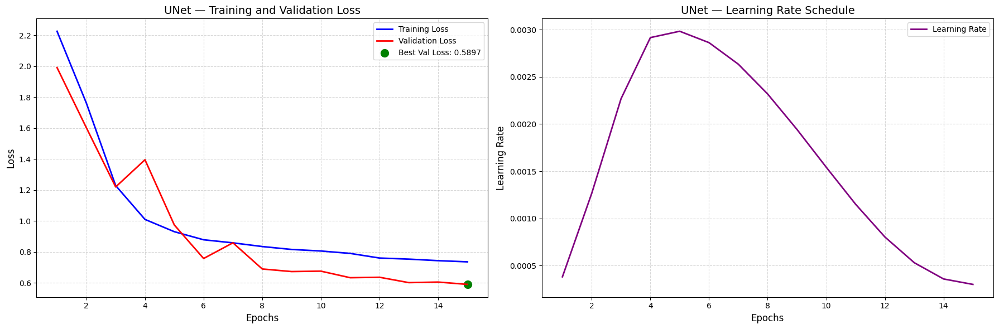


______________________________________________________________________________________________________________________________________________________
Attention UNet:


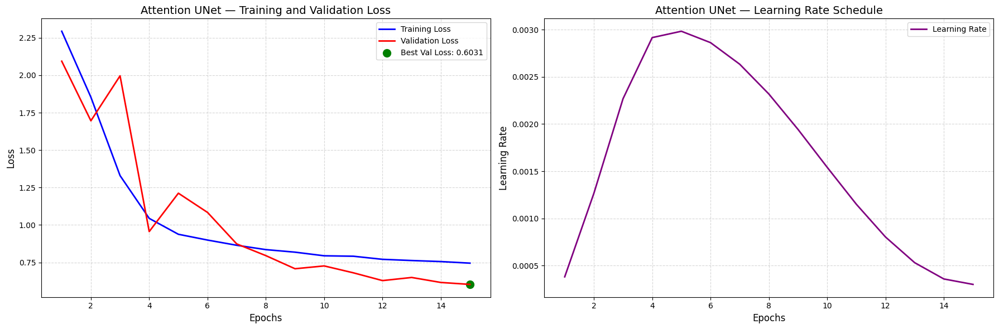


______________________________________________________________________________________________________________________________________________________
Residual Attention UNet:


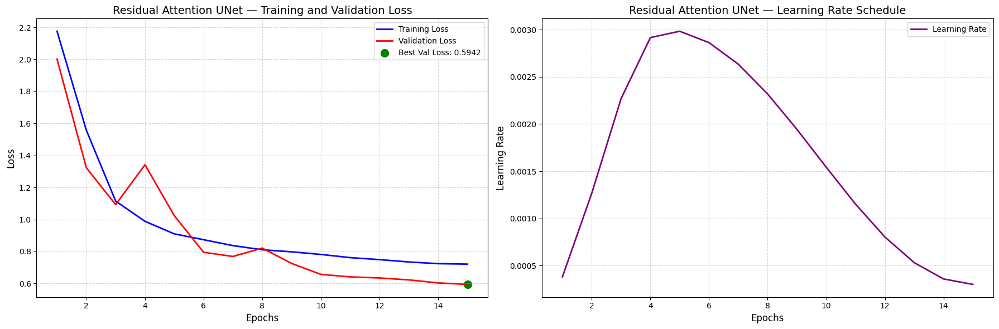

In [65]:
def plot_losses_and_lr(train_losses, val_losses, lr_history, model_name):
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    # Plot losses on first subplot
    epochs = np.arange(1, len(train_losses) + 1)
    ax1.plot(epochs, train_losses, label='Training Loss', color='blue', linewidth=2)
    ax1.plot(epochs, val_losses, label='Validation Loss', color='red', linewidth=2)
    ax1.set_title(f'{model_name} — Training and Validation Loss', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.5)

    # Mark best validation loss
    best_epoch = int(np.argmin(val_losses))
    ax1.scatter(best_epoch + 1, val_losses[best_epoch], color='green', s=100,
                label=f'Best Val Loss: {val_losses[best_epoch]:.4f}')
    ax1.legend(fontsize=10)

    # Plot learning rate schedule
    x_lr = np.arange(1, len(lr_history) + 1)
    ax2.plot(x_lr, lr_history, label='Learning Rate', color='purple', linewidth=2)
    ax2.set_title(f'{model_name} — Learning Rate Schedule', fontsize=14)
    ax2.set_xlabel('Epochs' if len(lr_history) == len(train_losses) else 'Steps', fontsize=12)
    ax2.set_ylabel('Learning Rate', fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.5)
    ax2.legend(fontsize=10)

    plt.tight_layout()
    plt.show()

models = [
    ("UNet",                    train_losses1, val_losses1, lr_history1),
    ("Attention UNet",          train_losses2, val_losses2, lr_history2),
    ("Residual Attention UNet", train_losses3, val_losses3, lr_history3),
]

for name, tr, va, lr in models:
    print("\n" + "_"*150)
    print(f"{name}:")
    plot_losses_and_lr(tr, va, lr, name)


### Prediction Visualisation

Display several images, their masks, and the predicted mask by your model.

In [63]:
def visualize_image_mask_prediction(images, masks, predictions, n=5):
    """
    Visualizes original images, ground truth masks, and predicted masks with accuracy metrics.

    Args:
        images (torch.Tensor): Batch of input images (N, C, H, W)
        masks (torch.Tensor): Batch of ground truth masks (N, 1, H, W)
        predictions (torch.Tensor): Batch of predicted masks (N, 1, H, W)
        n (int): Number of samples to display (max 5)
        threshold (float): Threshold for binary classification
    """
    plt.figure(figsize=(15, 4 * n))

    # Ensure we don't try to display more samples than available
    n = min(n, 5, images.shape[0])

    for i in range(n):
        # Convert tensors to numpy arrays
        img = images[i].permute(1, 2, 0).cpu().numpy()   # (H, W, C)
        mask = masks[i].squeeze().cpu().numpy()          # (H, W)
        pred = predictions[i].squeeze().cpu().numpy()    # (H, W)

        # Calculate metrics
        def calculate_metrics(true, pred):
            smooth = 1e-6
            true_flat = true.flatten()
            pred_flat = pred.flatten()

            # Pixel Accuracy
            accuracy = np.mean(true_flat == pred_flat)

            # IoU (Jaccard Index)
            intersection = np.sum(true_flat * pred_flat)
            union = np.sum(true_flat) + np.sum(pred_flat) - intersection
            iou = (intersection + smooth) / (union + smooth)

            # Dice Coefficient
            dice = (2 * intersection + smooth) / (np.sum(true_flat) + np.sum(pred_flat) + smooth)

            return accuracy, iou, dice

        accuracy, iou, dice = calculate_metrics(mask, pred)

        # Display original image
        plt.subplot(n, 4, 4*i + 1)
        plt.imshow(img)
        plt.title(f"Image {i+1}")
        plt.axis('off')

        # Display ground truth mask
        plt.subplot(n, 4, 4*i + 2)
        plt.imshow(mask, cmap='gray', vmin=0, vmax=1)
        plt.title("Ground Truth")
        plt.axis('off')

        # Display predicted mask
        plt.subplot(n, 4, 4*i + 3)
        plt.imshow(pred, cmap='gray', vmin=0, vmax=1)
        plt.title("Prediction")
        plt.axis('off')

        # Display metrics
        plt.subplot(n, 4, 4*i + 4)
        plt.text(0.1, 0.7, f"Pixel Acc: {accuracy:.3f}\nIoU: {iou:.3f}\nDice: {dice:.3f}",
                 fontsize=10, ha='left')
        plt.axis('off')
        plt.title("Metrics", pad=20)

    plt.tight_layout()
    plt.show()

Call the visualization for all 3 models.


______________________________________________________________________________________________________________________________________________________
UNet Predictions:


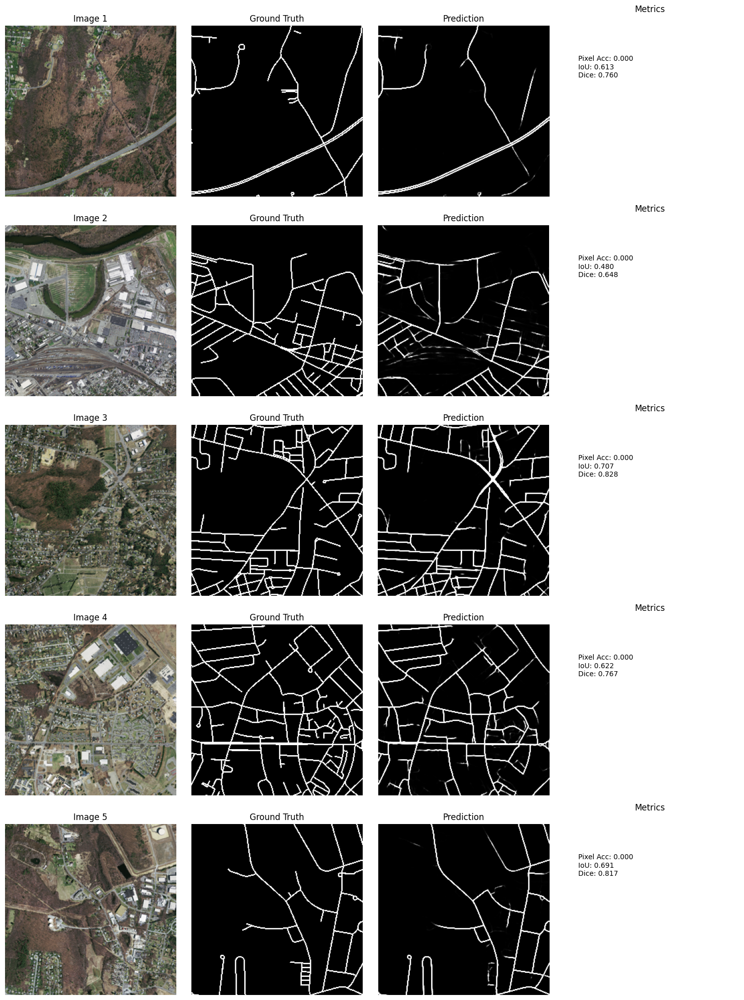


______________________________________________________________________________________________________________________________________________________
Attention UNet Predictions:


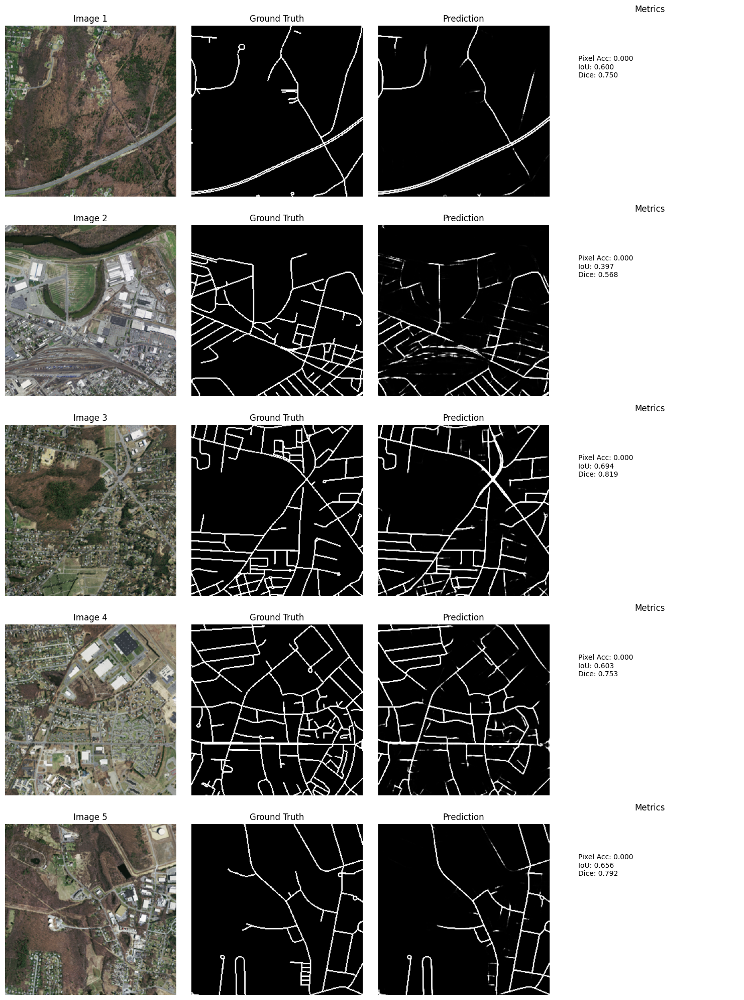


______________________________________________________________________________________________________________________________________________________
Residual Attention UNet Predictions:


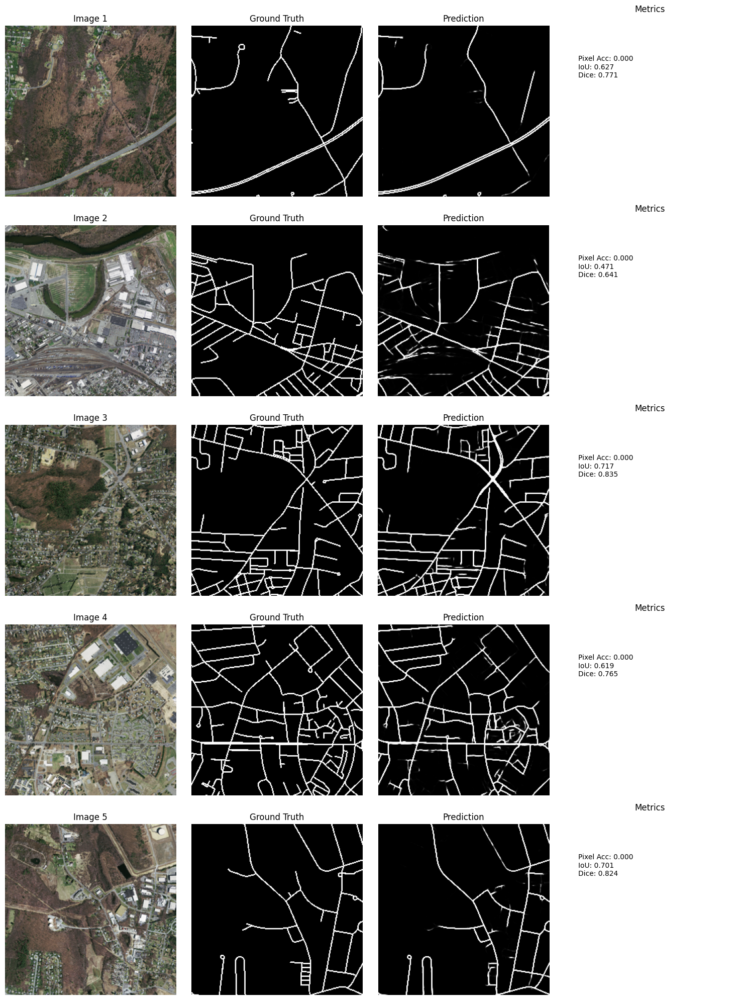

In [68]:
# Get a batch of validation data
images, masks = next(iter(test_loader))
images = images.to(device)
masks = masks.to(device)

# Make predictions and visualize for each model
with torch.no_grad():
    print("\n" + "_"*150)
    print("UNet Predictions:")
    predictions = unet(images)
    visualize_image_mask_prediction(images.cpu(), masks.cpu(), predictions.cpu())

    print("\n" + "_"*150)
    print("Attention UNet Predictions:")
    predictions = attention_unet(images)
    visualize_image_mask_prediction(images.cpu(), masks.cpu(), predictions.cpu())

    print("\n" + "_"*150)
    print("Residual Attention UNet Predictions:")
    predictions = resattn_unet(images)
    visualize_image_mask_prediction(images.cpu(), masks.cpu(), predictions.cpu())